In [1]:
import os
import sys
import cv2
import filecmp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

sys.path.insert(0, os.path.abspath('../'))
from src.lib import features as ft
from src.lib import centroids as centutils

/home/juanjo/VirtualEnvs/Fondef/lib/python3.8/site-packages/skan/csr.py:21: NumbaDeprecationWarning: The 'numba.jitclass' decorator has moved to 'numba.experimental.jitclass' to better reflect the experimental nature of the functionality. Please update your imports to accommodate this change and see http://numba.pydata.org/numba-doc/latest/reference/deprecation.html#change-of-jitclass-location for the time frame.
  @numba.jitclass(csr_spec)


# Feature analysis and visualization

### Preface

The images for this project have been delivered in three packages: _first_, (because it was the first one), _NegsiRNA_ (only images of NegsiRNA) and _Test_ (because I couldn't think of a better name). Inside each one of these folders, there are 4 subfolders: _Original_ (Cell-cell junction images), _Nuclei_, _Segmented_ (original images segmented) and _Skeletonized_ (skeleton of the original images). For each image, we've calculated it's features and now we are going to analyze those features a little bit more in depth.

#### Load features
We are going to load all the calculated features, and fill the NaN values with -1 (why? Because we are going to perform some comparisons and the statement ``np.nan = np.nan`` returns ``False`` 🙃. More information in https://towardsdatascience.com/navigating-the-hell-of-nans-in-python-71b12558895b)

In [2]:
df_first_path = '../results/first_features_bak.csv'
df_negsi_path = '../results/NegsiRNA_features_bak.csv'
df_test_path = '../results/Test_features_bak.csv'

In [3]:
df_first = pd.read_csv(df_first_path, index_col=0)
df_first = df_first.fillna(-1)
df_first


,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_eu_distance_std,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean
ACTB_B2_CA,0.603739,0.840889,8,11.673097,16.213742,10.770630,13.984421,0.970518,4.760655e-02,361,...,36.644488,0.927928,0.043215,1802,5,3.129856,0.344300,9.385630,6.708586,6.821478
ACTN4_L3_NO,0.694498,0.792442,2,5.328427,0.707107,4.621320,0.535534,0.868272,1.471863e-02,508,...,35.325742,0.931571,0.038830,2192,5,3.118157,0.329785,7.979354,5.130908,5.022501
ACTB_B2_NS,0.529037,1.180266,2,6.621320,4.535534,5.914214,4.363961,0.872069,6.171910e-02,348,...,33.706782,0.934128,0.037040,1796,5,3.131960,0.340088,13.342543,8.466754,8.152079
NegsiRNA_B1_NO,0.611931,1.085025,3,2.276142,1.863171,2.179106,1.696244,0.978017,3.807501e-02,414,...,31.529210,0.933158,0.040496,2281,5,3.140289,0.359689,10.740390,6.388646,6.126879
NegsiRNA_B1_CA,0.672008,0.749550,5,25.802439,24.656564,23.709567,23.061234,0.897672,1.110010e-01,291,...,39.414717,0.926734,0.048636,1637,6,3.149053,0.372899,9.099332,6.238017,6.140472
AKAP5_B2_CA,0.594433,0.953002,2,12.035534,5.363961,11.374260,5.315302,0.939998,2.269842e-02,248,...,40.259713,0.930517,0.035326,1405,5,3.128114,0.338449,11.509622,6.818744,6.402447
NegsiRNA_A2_NS,0.733231,0.748581,3,1.666667,0.577350,1.666667,0.577350,1.000000,0.000000e+00,436,...,33.715701,0.931461,0.038812,2102,5,3.132731,0.340683,8.207698,6.591696,6.494735
NegsiRNA_A2b_NS,0.685397,0.894699,32,2.524049,2.165192,2.423873,1.967435,0.976890,3.554007e-02,381,...,35.605468,0.928869,0.044839,2049,5,3.138116,0.358888,9.953676,8.189837,8.059194
AKT1_B1_CA,0.657028,0.561268,9,7.923745,6.449575,7.675348,6.262999,0.976414,2.877320e-02,237,...,40.105346,0.927828,0.048078,1271,5,3.143194,0.361327,7.765324,5.837886,5.427056
ADAM9_C2_NO,0.648934,0.844729,15,7.826465,9.653192,7.121741,8.698161,0.940723,6.570897e-02,625,...,28.633922,0.928395,0.050198,3107,5,3.151915,0.379001,7.599178,5.420569,5.360264


In [4]:
df_negsi = pd.read_csv(df_negsi_path, index_col=0)
df_negsi = df_negsi.fillna(-1)
df_negsi

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_eu_distance_std,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean
NegsiRNA_C3c_CA,0.772331,0.461239,2,2.828427,0.000000,2.828427,0.000000,1.000000,0.000000,213,...,51.039731,0.928818,0.035266,1156,6,3.132353,0.368235,6.126745,4.889685,4.341952
NegsiRNA_C3b_CA,0.650674,0.913848,10,2.065685,1.209126,2.047871,1.204724,0.992621,0.023335,304,...,32.524791,0.935073,0.032228,1830,5,3.121311,0.333116,9.222267,5.114865,4.716636
NegsiRNA_E3_NO,0.633006,0.893483,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,446,...,32.458687,0.933285,0.033524,2187,5,3.139918,0.358568,9.098694,5.132398,4.844048
NegsiRNA_L2_NS,0.709905,0.566952,4,9.224874,15.898662,8.743313,14.935617,0.985439,0.029123,367,...,41.626902,0.927437,0.041164,1639,5,3.153752,0.372363,7.227587,5.183694,5.221077
NegsiRNA_L1_CA,0.651109,0.842740,2,15.207107,15.849242,15.009612,15.569942,0.992523,0.010574,281,...,31.461633,0.933604,0.033201,1913,5,3.125457,0.340574,7.994286,4.782496,4.374887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NegsiRNA_H2_CA,0.712983,0.747116,3,10.299832,14.899824,9.001932,12.804211,0.930342,0.067686,291,...,31.187113,0.932444,0.033376,2034,5,3.140118,0.351333,6.836953,3.580644,3.303955
NegsiRNA_I3_NO,0.612887,0.861740,2,2.500000,2.121320,2.500000,2.121320,1.000000,0.000000,386,...,34.082777,0.929160,0.037500,1813,5,3.128516,0.339572,9.573630,6.039179,5.891320
NegsiRNA_I2_CA,0.636493,0.941587,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,507,...,29.337301,0.930631,0.049304,3025,6,3.161653,0.385674,8.714587,6.665367,6.684823
NegsiRNA_H3_NS,0.628314,0.862938,5,10.028427,20.188177,9.434813,18.860816,0.987135,0.028767,288,...,35.721261,0.932738,0.034584,1564,5,3.116368,0.322654,9.349122,5.607799,5.347977


In [5]:
df_test = pd.read_csv(df_test_path, index_col=0)
df_test = df_test.fillna(-1)
df_test

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_eu_distance_std,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean
AKT1_B2_NO,0.550921,0.990912,1,24.384776,-1.000000,23.021729,-1.000000,0.944103,-1.000000,297,...,37.876221,0.930683,0.036448,1585,5,3.127445,0.340954,10.948303,6.305560,6.077615
ACTB_B2_CA,0.603739,0.840889,8,11.673097,16.213742,10.770630,13.984421,0.970518,0.047607,361,...,36.644488,0.927928,0.043215,1802,5,3.129856,0.344300,9.385630,6.708586,6.821478
JUP_D1_NO,0.620014,0.875483,1,21.485281,-1.000000,19.313208,-1.000000,0.898904,-1.000000,238,...,34.947585,0.928770,0.036267,1888,5,3.139301,0.349306,8.035211,4.471861,4.284300
FYN_E3_NS,0.706592,0.757418,4,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,224,...,39.962955,0.929690,0.034615,1343,5,3.133284,0.344235,8.543062,5.019643,4.939976
ACTN4_L1_NO,0.590068,0.957492,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,482,...,31.822752,0.928083,0.041849,2472,5,3.134304,0.346860,8.715788,5.563401,5.309031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PALLD_F2_CA,0.550227,1.058792,1,13.000000,-1.000000,13.000000,-1.000000,1.000000,-1.000000,272,...,34.956253,0.933290,0.033352,1770,5,3.124859,0.333959,10.779967,6.281335,6.057167
EZR_C3_NO,0.676549,0.870945,1,2.000000,-1.000000,2.000000,-1.000000,1.000000,-1.000000,312,...,36.376340,0.928974,0.038882,1747,5,3.127075,0.344878,8.982927,5.137285,4.744985
DNMBP_A3_NO,0.603660,0.678635,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,411,...,37.471472,0.922374,0.055726,1867,5,3.135512,0.350006,7.369823,4.892748,4.893513
NUMB_E3_CA,0.684265,0.813290,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,275,...,34.393439,0.932122,0.031318,1723,5,3.131167,0.347745,8.482209,5.014825,4.877564


#### Look for duplicates

Now that we've loaded the features, it's important to check if there are duplicated images: i.e., images that have been sent in more than one package.

In [6]:
df_inter_first_negsi = df_first.merge(df_negsi, left_index=True, right_index=True)
df_inter_first_negsi

,cell_area_ratio_x,white_area_ratio_x,e2e_n_x,e2e_distance_mean_x,e2e_distance_std_x,e2e_eu_distance_mean_x,e2e_eu_distance_std_x,e2e_distance_ratio_mean_x,e2e_distance_ratio_std_x,j2e_n_x,...,j2j_eu_distance_std_y,j2j_distance_ratio_mean_y,j2j_distance_ratio_std_y,nodes_n_y,nodes_max_y,nodes_mean_y,nodes_std_y,medial_axis_mean_y,medial_axis_std_y,voronoi_approx_mean_y
NegsiRNA_B1_NO,0.611931,1.085025,3,2.276142,1.863171,2.179106,1.696244,0.978017,3.807501e-02,414,...,33.879977,0.933472,0.033616,1891,5,3.135907,0.357789,10.392432,6.126671,5.905986
NegsiRNA_B1_CA,0.672008,0.749550,5,25.802439,24.656564,23.709567,23.061234,0.897672,1.110010e-01,291,...,39.844243,0.927941,0.038266,1499,5,3.143429,0.369052,9.479603,6.685522,6.534179
NegsiRNA_A2_NS,0.733231,0.748581,3,1.666667,0.577350,1.666667,0.577350,1.000000,0.000000e+00,436,...,37.145793,0.928652,0.031755,1559,5,3.136626,0.347167,7.648163,5.710838,5.584388
NegsiRNA_A2b_NS,0.685397,0.894699,32,2.524049,2.165192,2.423873,1.967435,0.976890,3.554007e-02,381,...,41.189162,0.929429,0.034394,1521,5,3.138725,0.356889,7.990401,5.766226,5.521191
NegsiRNA_A2b_NO,0.641613,0.849111,6,10.495094,11.320072,9.576659,10.017242,0.948641,5.953772e-02,560,...,38.102565,0.931376,0.035664,1786,5,3.137738,0.351063,9.006944,6.356030,6.262408
NegsiRNA_A2b_CA,0.600595,0.933020,19,5.176597,7.424402,4.782726,6.473815,0.958700,5.155946e-02,431,...,39.686620,0.933297,0.034097,1619,5,3.120445,0.329254,10.396729,9.848136,9.861628
NegsiRNA_A3_NS,0.646983,0.817398,8,7.099874,7.684915,6.733606,7.154103,0.967150,3.615680e-02,480,...,31.760628,0.930726,0.038317,2381,5,3.135237,0.348063,7.995434,4.745192,4.583746
NegsiRNA_A3_NO,0.691944,0.739124,3,2.828427,1.414214,2.828427,1.414214,1.000000,1.570092e-16,548,...,37.403232,0.926752,0.039289,1979,5,3.127337,0.337867,7.495754,4.535687,4.360939
NegsiRNA_A3_CA,0.694720,0.811982,7,2.926469,1.334034,2.791602,1.254903,0.961179,3.669457e-02,525,...,36.572388,0.930257,0.043075,2005,5,3.134663,0.352859,7.328101,4.332372,4.178369


In [7]:
df_inter_first_test = df_first.merge(df_test, left_index=True, right_index=True)
df_inter_first_test

,cell_area_ratio_x,white_area_ratio_x,e2e_n_x,e2e_distance_mean_x,e2e_distance_std_x,e2e_eu_distance_mean_x,e2e_eu_distance_std_x,e2e_distance_ratio_mean_x,e2e_distance_ratio_std_x,j2e_n_x,...,j2j_eu_distance_std_y,j2j_distance_ratio_mean_y,j2j_distance_ratio_std_y,nodes_n_y,nodes_max_y,nodes_mean_y,nodes_std_y,medial_axis_mean_y,medial_axis_std_y,voronoi_approx_mean_y
ACTB_B2_CA,0.603739,0.840889,8,11.673097,16.213742,10.770630,13.984421,0.970518,0.047607,361,...,36.644488,0.927928,0.043215,1802,5,3.129856,0.344300,9.385630,6.708586,6.821478
ACTN4_L3_NO,0.694498,0.792442,2,5.328427,0.707107,4.621320,0.535534,0.868272,0.014719,508,...,35.325742,0.931571,0.038830,2192,5,3.118157,0.329785,7.979354,5.130908,5.022501
ACTB_B2_NS,0.529037,1.180266,2,6.621320,4.535534,5.914214,4.363961,0.872069,0.061719,348,...,33.706782,0.934128,0.037040,1796,5,3.131960,0.340088,13.342543,8.466754,8.152079
AKAP5_B2_CA,0.594433,0.953002,2,12.035534,5.363961,11.374260,5.315302,0.939998,0.022698,248,...,40.259713,0.930517,0.035326,1405,5,3.128114,0.338449,11.509622,6.818744,6.402447
ACTB_B2_NO,0.608780,0.863785,1,6.000000,-1.000000,6.000000,-1.000000,1.000000,-1.000000,374,...,37.788545,0.926578,0.041872,1828,6,3.130744,0.349861,9.527447,6.542313,6.189000
AKT1_B2_CA,0.499326,1.209632,2,41.177670,24.677670,37.426872,23.096722,0.902997,0.019741,523,...,30.247814,0.934924,0.042199,2357,5,3.125583,0.336461,13.148524,8.644624,8.013979
ACTR3_C3_NO,0.614020,1.029477,3,23.242641,37.662677,22.213203,35.879805,0.984573,0.026721,449,...,29.385923,0.930908,0.038700,2295,5,3.133333,0.342489,10.035960,6.481891,5.957289


In [8]:
df_inter_negsi_test = df_negsi.merge(df_test, left_index=True, right_index=True)
df_inter_negsi_test

,cell_area_ratio_x,white_area_ratio_x,e2e_n_x,e2e_distance_mean_x,e2e_distance_std_x,e2e_eu_distance_mean_x,e2e_eu_distance_std_x,e2e_distance_ratio_mean_x,e2e_distance_ratio_std_x,j2e_n_x,...,j2j_eu_distance_std_y,j2j_distance_ratio_mean_y,j2j_distance_ratio_std_y,nodes_n_y,nodes_max_y,nodes_mean_y,nodes_std_y,medial_axis_mean_y,medial_axis_std_y,voronoi_approx_mean_y


#### Check if the features are the same for the duplicated images

There are 9 duplicates in the pair first-NegsiRNA, and 7 in the pair first-Test. Those images have the same names, and refer to the same experiment. The next obvious question is: are the images exactly the same? and what can we say about the features?

In [9]:
columns = set(col_name[:-2] for col_name in df_inter_first_test.columns)
for index, row in df_inter_first_negsi.iterrows():
    print("##############################################################################")
    n = 0
    for col_name in columns:
        if row[col_name + "_x"] != row[col_name + "_y"]:
            n += 1
    print(index, "Differences in ", n, "features")

##############################################################################
NegsiRNA_B1_NO Differences in  29 features
##############################################################################
NegsiRNA_B1_CA Differences in  30 features
##############################################################################
NegsiRNA_A2_NS Differences in  27 features
##############################################################################
NegsiRNA_A2b_NS Differences in  29 features
##############################################################################
NegsiRNA_A2b_NO Differences in  29 features
##############################################################################
NegsiRNA_A2b_CA Differences in  30 features
##############################################################################
NegsiRNA_A3_NS Differences in  30 features
##############################################################################
NegsiRNA_A3_NO Differences in  29 features
#####################

In [10]:
for index, row in df_inter_first_test.iterrows():
    print("##############################################################################")
    n = 0
    for col_name in columns:
        if row[col_name + "_x"] != row[col_name + "_y"]:
            n += 1
    print(index, "Differences in ", n, "features")

##############################################################################
ACTB_B2_CA Differences in  0 features
##############################################################################
ACTN4_L3_NO Differences in  0 features
##############################################################################
ACTB_B2_NS Differences in  0 features
##############################################################################
AKAP5_B2_CA Differences in  0 features
##############################################################################
ACTB_B2_NO Differences in  0 features
##############################################################################
AKT1_B2_CA Differences in  0 features
##############################################################################
ACTR3_C3_NO Differences in  0 features


In the pair first-NegsiRNA, the features are different for "duplicated" images. But in the pair first-Test, the features are the same. Lets see if the input images are identical.

In [11]:
template_path = "../data/{folder}/{img_type}/{name}{suffix}.tif"

type_suffix_map = {"Original": "j", "Nuclei": "n", 
                   "Skeletonized": "j-SK", "Segmented": "j-BI"}

for index in df_inter_first_negsi.index:
    different = []
    for img_type, suffix in type_suffix_map.items():
        first_path = template_path.format(folder='first', img_type=img_type, name=index, suffix=suffix)
        negsi_path = template_path.format(folder='NegsiRNA', img_type=img_type, name=index, suffix=suffix)
        if not filecmp.cmp(first_path, negsi_path, shallow=False):
            different.append(img_type)
    if len(different) == 0:
        print(index, ": no difference in files")
    elif len(different) == 1:
        print(index, ": difference in", different[0])
    else:
        print(index, ": difference in", ', '.join(different[:-1]), "and", different[-1])

NegsiRNA_B1_NO : difference in Skeletonized and Segmented
NegsiRNA_B1_CA : difference in Skeletonized and Segmented
NegsiRNA_A2_NS : difference in Skeletonized and Segmented
NegsiRNA_A2b_NS : difference in Skeletonized and Segmented
NegsiRNA_A2b_NO : difference in Skeletonized and Segmented
NegsiRNA_A2b_CA : difference in Skeletonized and Segmented
NegsiRNA_A3_NS : difference in Skeletonized and Segmented
NegsiRNA_A3_NO : difference in Skeletonized and Segmented
NegsiRNA_A3_CA : difference in Skeletonized and Segmented


In [12]:
for index in df_inter_first_test.index:
    different = []
    for img_type, suffix in type_suffix_map.items():
        first_path = template_path.format(folder='first', img_type=img_type, name=index, suffix=suffix)
        test_path = template_path.format(folder='Test', img_type=img_type, name=index, suffix=suffix)
        if not filecmp.cmp(first_path, test_path, shallow=False):
            different.append(img_type)
    if len(different) == 0:
        print(index, ": no difference in files")
    elif len(different) == 1:
        print(index, ": difference in", different[0])
    else:
        print(index, ": difference in", ', '.join(different[:-1]), "and", different[-1])
        

ACTB_B2_CA : difference in Skeletonized
ACTN4_L3_NO : difference in Skeletonized
ACTB_B2_NS : difference in Skeletonized
AKAP5_B2_CA : difference in Skeletonized
ACTB_B2_NO : difference in Skeletonized
AKT1_B2_CA : difference in Skeletonized
ACTR3_C3_NO : difference in Skeletonized


There are differences in all the skeletonized versions, and in the segmented ones in the pair first-NegsiRNA. Lets check if those differences are relevant and visible. 

In [13]:
def get_diff_image(img1, img2):
    if img1.shape != img2.shape:
        return None
    equal_mask = img1 == img2

    white_first_mask = np.bitwise_and(~equal_mask, img1 == 255)
    white_negsi_mask = np.bitwise_and(~equal_mask, img2 == 255)

    height, width = img1.shape
    diff_img = np.zeros((height, width), np.uint8)

    diff_img[equal_mask] = img1[equal_mask]
    diff_img = cv2.cvtColor(diff_img, cv2.COLOR_GRAY2BGR)
    diff_img[white_first_mask] = (255, 0, 0)
    diff_img[white_negsi_mask] = (0, 255, 0)
    
    return diff_img



#### Mismatches in duplicated images in <font color='red'>first</font> and <font color='green'>NegsiRNA</font> folders.

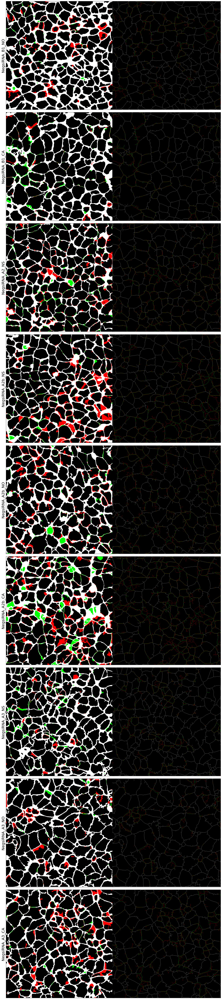

In [14]:
imgs_types = ["Segmented", "Skeletonized"]
plt_shape = np.array([len(df_inter_first_negsi), len(imgs_types)])
fig, axes = plt.subplots(*plt_shape, figsize=8*np.flip(plt_shape))

for iii, img_name in enumerate(df_inter_first_negsi.index):
    for jjj, img_type in enumerate(imgs_types):
        first_path = template_path.format(folder='first', img_type=img_type, name=img_name, suffix=type_suffix_map[img_type])
        negsi_path = template_path.format(folder='NegsiRNA', img_type=img_type, name=img_name, suffix=type_suffix_map[img_type])
        first_img = cv2.imread(first_path, cv2.IMREAD_GRAYSCALE)
        negsi_img = cv2.imread(negsi_path, cv2.IMREAD_GRAYSCALE)

        diff_img = get_diff_image(first_img, negsi_img)
        axes[iii, jjj].imshow(diff_img)
        axes[iii, jjj].set_yticks([])
        axes[iii, jjj].set_xticks([])
        if jjj == 0:
            axes[iii, jjj].set_ylabel(img_name, fontsize=20)

fig.tight_layout()

#### Mismatches in duplicated images in <font color='red'>first</font> and <font color='green'>Test</font> folders.

ACTB_B2_CA : difference in 0 pixels
ACTN4_L3_NO : difference in 0 pixels
ACTB_B2_NS : difference in 0 pixels
AKAP5_B2_CA : difference in 0 pixels
ACTB_B2_NO : difference in 0 pixels
AKT1_B2_CA : difference in 0 pixels
ACTR3_C3_NO : difference in 0 pixels


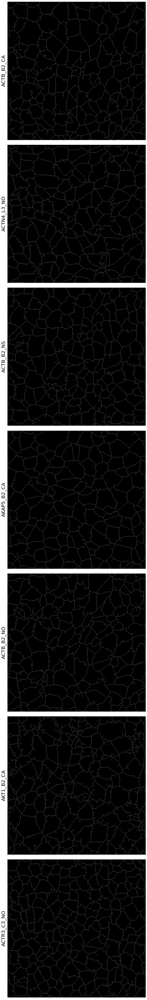

In [15]:
imgs_types = ["Skeletonized"]
plt_shape = np.array([len(df_inter_first_test), len(imgs_types)])
fig, axes = plt.subplots(*plt_shape, figsize=8*np.flip(plt_shape))

for iii, img_name in enumerate(df_inter_first_test.index):
    for jjj, img_type in enumerate(imgs_types):
        first_path = template_path.format(folder='first', img_type=img_type, name=img_name, suffix=type_suffix_map[img_type])
        test_path = template_path.format(folder='Test', img_type=img_type, name=img_name, suffix=type_suffix_map[img_type])
        first_img = cv2.imread(first_path, cv2.IMREAD_UNCHANGED)
        test_img = cv2.imread(test_path, cv2.IMREAD_UNCHANGED)

        print(img_name, ": difference in", len(np.where(first_img != test_img)[0]), "pixels")
        
        diff_img = get_diff_image(first_img, test_img)
        axes[iii].imshow(diff_img)
        axes[iii].set_yticks([])
        axes[iii].set_xticks([])
        axes[iii].set_ylabel(img_name, fontsize=20)

fig.tight_layout()

There's no difference in the content of the images (pixels) and neither in the metadata. But for every skeletonized image, there's a difference of a few bytes and I still haven't found from where comes that difference. Anyway, it doesn't affect the calculated features, so there's nothing to worry about.

❗ **Issue #1**: Mismatches in the duplicates. Fix: not yet, we have to talk about this.

#### Clean and concatenate the dataframes

Given the previous analysis, we will remove the intersection of _first_ and _Test_, because the images are duplicated AND the computed features are identical. In the other hand, we won't remove the intersection of _first_ and _NegsiRNA_ because, although the original and nuclei images are duplicated, the segmented and skeletonized versions are different, and it affects the extracted features.

In [16]:
df_test_no_intersection = df_test.drop(df_inter_first_test.index)
df_test_no_intersection

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_eu_distance_std,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean
AKT1_B2_NO,0.550921,0.990912,1,24.384776,-1.0,23.021729,-1.0,0.944103,-1.0,297,...,37.876221,0.930683,0.036448,1585,5,3.127445,0.340954,10.948303,6.305560,6.077615
JUP_D1_NO,0.620014,0.875483,1,21.485281,-1.0,19.313208,-1.0,0.898904,-1.0,238,...,34.947585,0.928770,0.036267,1888,5,3.139301,0.349306,8.035211,4.471861,4.284300
FYN_E3_NS,0.706592,0.757418,4,1.000000,0.0,1.000000,0.0,1.000000,0.0,224,...,39.962955,0.929690,0.034615,1343,5,3.133284,0.344235,8.543062,5.019643,4.939976
ACTN4_L1_NO,0.590068,0.957492,0,-1.000000,-1.0,-1.000000,-1.0,-1.000000,-1.0,482,...,31.822752,0.928083,0.041849,2472,5,3.134304,0.346860,8.715788,5.563401,5.309031
GNA12_E1_NS,0.690828,0.792156,1,58.041631,-1.0,51.009803,-1.0,0.878849,-1.0,174,...,44.563117,0.925058,0.040911,1213,5,3.122836,0.335699,9.687430,6.658503,6.316007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PALLD_F2_CA,0.550227,1.058792,1,13.000000,-1.0,13.000000,-1.0,1.000000,-1.0,272,...,34.956253,0.933290,0.033352,1770,5,3.124859,0.333959,10.779967,6.281335,6.057167
EZR_C3_NO,0.676549,0.870945,1,2.000000,-1.0,2.000000,-1.0,1.000000,-1.0,312,...,36.376340,0.928974,0.038882,1747,5,3.127075,0.344878,8.982927,5.137285,4.744985
DNMBP_A3_NO,0.603660,0.678635,0,-1.000000,-1.0,-1.000000,-1.0,-1.000000,-1.0,411,...,37.471472,0.922374,0.055726,1867,5,3.135512,0.350006,7.369823,4.892748,4.893513
NUMB_E3_CA,0.684265,0.813290,0,-1.000000,-1.0,-1.000000,-1.0,-1.000000,-1.0,275,...,34.393439,0.932122,0.031318,1723,5,3.131167,0.347745,8.482209,5.014825,4.877564


In [17]:
df_first['folder'] = 'first'
df_negsi['folder'] = 'NegsiRNA'
df_test_no_intersection['folder'] = 'Test'

In [18]:
df_all = pd.concat([df_first, df_negsi, df_test_no_intersection])
df_all

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTB_B2_CA,0.603739,0.840889,8,11.673097,16.213742,10.770630,13.984421,0.970518,0.047607,361,...,0.927928,0.043215,1802,5,3.129856,0.344300,9.385630,6.708586,6.821478,first
ACTN4_L3_NO,0.694498,0.792442,2,5.328427,0.707107,4.621320,0.535534,0.868272,0.014719,508,...,0.931571,0.038830,2192,5,3.118157,0.329785,7.979354,5.130908,5.022501,first
ACTB_B2_NS,0.529037,1.180266,2,6.621320,4.535534,5.914214,4.363961,0.872069,0.061719,348,...,0.934128,0.037040,1796,5,3.131960,0.340088,13.342543,8.466754,8.152079,first
NegsiRNA_B1_NO,0.611931,1.085025,3,2.276142,1.863171,2.179106,1.696244,0.978017,0.038075,414,...,0.933158,0.040496,2281,5,3.140289,0.359689,10.740390,6.388646,6.126879,first
NegsiRNA_B1_CA,0.672008,0.749550,5,25.802439,24.656564,23.709567,23.061234,0.897672,0.111001,291,...,0.926734,0.048636,1637,6,3.149053,0.372899,9.099332,6.238017,6.140472,first
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PALLD_F2_CA,0.550227,1.058792,1,13.000000,-1.000000,13.000000,-1.000000,1.000000,-1.000000,272,...,0.933290,0.033352,1770,5,3.124859,0.333959,10.779967,6.281335,6.057167,Test
EZR_C3_NO,0.676549,0.870945,1,2.000000,-1.000000,2.000000,-1.000000,1.000000,-1.000000,312,...,0.928974,0.038882,1747,5,3.127075,0.344878,8.982927,5.137285,4.744985,Test
DNMBP_A3_NO,0.603660,0.678635,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,411,...,0.922374,0.055726,1867,5,3.135512,0.350006,7.369823,4.892748,4.893513,Test
NUMB_E3_CA,0.684265,0.813290,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,275,...,0.932122,0.031318,1723,5,3.131167,0.347745,8.482209,5.014825,4.877564,Test


### Feature analysis

Lets focus on the easiest features: ``white_area_ratio`` y ``cell_area_ratio``.  Before diving into the visualization for all the images, let's realize something: given that both features are ratios, then they must be in the range [0, 1]. 

In [19]:
df_all[df_all['white_area_ratio'] > 1]

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTB_B2_NS,0.529037,1.180266,2,6.621320,4.535534,5.914214,4.363961,0.872069,0.061719,348,...,0.934128,0.037040,1796,5,3.131960,0.340088,13.342543,8.466754,8.152079,first
NegsiRNA_B1_NO,0.611931,1.085025,3,2.276142,1.863171,2.179106,1.696244,0.978017,0.038075,414,...,0.933158,0.040496,2281,5,3.140289,0.359689,10.740390,6.388646,6.126879,first
AKT1_B2_CA,0.499326,1.209632,2,41.177670,24.677670,37.426872,23.096722,0.902997,0.019741,523,...,0.934924,0.042199,2357,5,3.125583,0.336461,13.148524,8.644624,8.013979,first
ACTR3_C3_NO,0.614020,1.029477,3,23.242641,37.662677,22.213203,35.879805,0.984573,0.026721,449,...,0.930908,0.038700,2295,5,3.133333,0.342489,10.035960,6.481891,5.957289,first
NegsiRNA_B1_NO,0.595098,1.002693,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,337,...,0.933472,0.033616,1891,5,3.135907,0.357789,10.392432,6.126671,5.905986,NegsiRNA
NegsiRNA_I1_NO,0.553000,1.064306,3,2.885618,3.265986,2.801041,3.119495,0.987295,0.022006,363,...,0.932318,0.036678,1763,5,3.123653,0.332613,11.856011,7.517557,6.415828,NegsiRNA
NegsiRNA_B3_NO,0.572119,1.044949,3,1.471405,0.502447,1.471405,0.502447,1.000000,0.000000,379,...,0.933084,0.033829,2016,5,3.127480,0.340865,10.564517,6.679725,6.264446,NegsiRNA
NegsiRNA_G1_NO,0.550028,1.137925,1,24.071068,-1.000000,21.189620,-1.000000,0.880294,-1.000000,349,...,0.935054,0.033558,2014,5,3.122145,0.328966,11.350037,6.699856,6.247341,NegsiRNA
NegsiRNA_C1_NO,0.558008,1.053466,1,52.485281,-1.000000,50.000000,-1.000000,0.952648,-1.000000,308,...,0.934161,0.031216,1781,5,3.126334,0.338918,11.151237,8.242568,7.754442,NegsiRNA
NegsiRNA_H1_NO,0.557182,1.058542,3,1.804738,1.393847,1.720759,1.248392,0.975403,0.042603,374,...,0.931785,0.034964,1947,5,3.126862,0.337416,11.200560,7.069431,6.824917,NegsiRNA


In [20]:
df_all[df_all['cell_area_ratio'] > 1]

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTN4_L2_NO,2.392915,0.395705,5,7.579899,10.316081,7.207723,9.877293,0.961666,0.037520,324,...,0.921050,0.062056,1380,5,3.126087,0.338433,7.740310,5.698707,5.822291,first
NegsiRNA_A1_CA,19.490802,0.680798,1,20.242641,-1.000000,15.620499,-1.000000,0.771663,-1.000000,280,...,0.928510,0.037008,1311,5,3.116705,0.328118,9.036604,5.562741,5.676593,NegsiRNA
NegsiRNA_B2_NS,19.397115,0.902569,1,2.828427,-1.000000,2.828427,-1.000000,1.000000,-1.000000,345,...,0.934036,0.036022,1630,5,3.133742,0.345740,10.658011,6.479582,6.542096,NegsiRNA
NegsiRNA_A1_NS,15.536529,0.612578,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,173,...,0.928579,0.034625,998,5,3.133267,0.348595,8.346114,5.494982,5.582310,NegsiRNA
NegsiRNA_A1_NO,21.381173,0.841942,3,2.138071,0.801859,2.138071,0.801859,1.000000,0.000000,290,...,0.931039,0.033547,1275,4,3.099608,0.299476,10.799964,6.503676,6.515877,NegsiRNA
CD151_A3_NO,1.627172,0.610737,20,39.034776,23.087470,35.496719,21.396825,0.910786,0.043093,702,...,0.925788,0.048577,2455,5,3.142159,0.362940,6.539909,4.130638,3.965183,Test


Nevertheless, the computed features don't hold that assertion, so **there must be something wrong**.

After reviewing the code, we can see that the problem for the ``white_area_ratio`` is in the next snippet:
```python
white_area = len(jbin_img[np.where(jbin_img != 0)]) 
```
Here, ``jbin_img`` is the segmented CCJ image. But, because of the way the code is written, that image has 3 channels. And np.where looks for the condition in all the points, INCLUDING THE DEPTH. So, if you have an image with N white pixels, the result of the previous operation will be 3N, and that can be bigger than the total area of the image.

The solution is to rewrite that line as:
```python
white_area = len(jbin_img[np.all(jbin_img == [0,0,0], axis=-1)]) 
```

❗ **Issue #2**: Error in the code. Fix: yes, one line of code.

Now, lets view the image with the highest ``cell_area_ratio`` and its features.

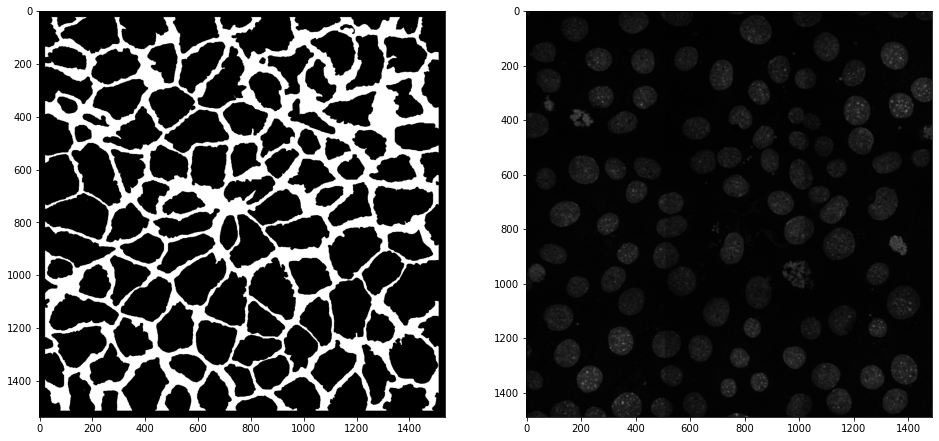

In [21]:
seg_path = '../data/NegsiRNA/Segmented/NegsiRNA_A1_NOj-BI.tif'
seg_img = cv2.imread(seg_path)
nuclei_path = '../data/NegsiRNA/Nuclei/NegsiRNA_A1_NOn.tif'
nuclei_img = cv2.imread(nuclei_path)

fig, axes = plt.subplots(1,2, figsize=(16, 8))
axes[0].imshow(seg_img)
axes[1].imshow(nuclei_img)

In [22]:
centroids = centutils.get_nuclei_centroids(nuclei_img)
centroids = centutils.clean_centroids(centroids, seg_img)
centroids, moments = centutils.get_moments_cells(centroids, seg_img)

areas = np.array([m['m00'] for m in moments])
areas.sort()
areas

array([   3354.5,    5299. ,    5669.5,    5718. ,    6334.5,    8459.5,
          8710. ,    8784. ,    9133. ,    9465.5,    9558. ,    9838.5,
          9954. ,    9969.5,   10200.5,   10699.5,   10861.5,   11110.5,
         12099.5,   12228.5,   12253.5,   12459. ,   12487.5,   12712. ,
         12938.5,   13233. ,   14087.5,   14138. ,   14155. ,   14179. ,
         14391.5,   14401.5,   14608.5,   14857.5,   14893.5,   15419. ,
         15596. ,   16109. ,   16176.5,   16433. ,   16678. ,   16883. ,
         17337. ,   17495. ,   17573. ,   17866.5,   18577.5,   19119.5,
         19438.5,   19655.5,   19665. ,   19993. ,   20076.5,   20984. ,
         21596.5,   21619. ,   22087. ,   22481.5,   23910. ,   24292.5,
         25353. ,   25564.5,   25748. ,   26821.5, 2356225. , 2356225. ,
       2356225. , 2356225. , 2356225. , 2356225. , 2356225. , 2356225. ,
       2356225. , 2356225. , 2356225. , 2356225. , 2356225. , 2356225. ,
       2356225. , 2356225. , 2356225. , 2356225. , 

In [23]:
1536**2

2359296

The biggest 21 areas are all equals among them, and just a little bit smaller than the total area of the image (1536^2 = 2359296). In the code, we are removing the outliers: those cells whose size is bigger than 3 times the standard deviation. But here there are 21 (TWENTY ONE) huge areas, so the mean and the standard deviation lose their meaning.

So, why is this happening? The issue is the black padding around the segmented image. The nuclei image has a size of 1489x1489, while the segmented image has a size of 1536x1536. The black padding around the image messes with the connectivity of the pixels, and it creates a huge connected component that has the same size of all the image. And it's counted a lot of times: it is counted for each detected nucleus at the border, that is touching the padding.

The solution is to clip the image at the center.

In [24]:
def clip_image(img, new_size):
    # It is assumed that there is a uniform padding around the image, so the
    # returned image is clipped at the center.
    height, width = img.shape[:2]
    new_height, new_width = new_size
    i_coord = (height - new_height) // 2
    j_coord = (width - new_width) // 2
    return img[i_coord: i_coord + new_height, j_coord: j_coord + new_width]


Text(0.5, 1.0, 'Clipped segmented image (1489x1489)')

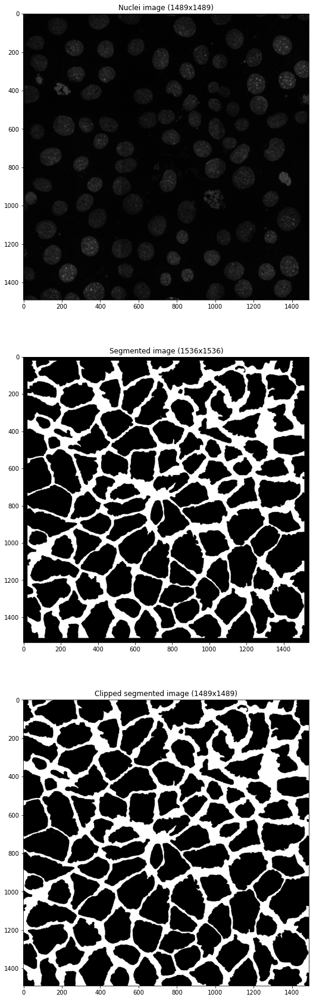

In [25]:
clipped_img = clip_image(seg_img, nuclei_img.shape[:2])

fig, ax = plt.subplots(3, figsize=(10, 30))
ax[0].imshow(nuclei_img)
ax[0].set_title('Nuclei image ({}x{})'.format(nuclei_img.shape[0], nuclei_img.shape[1]))
ax[1].imshow(seg_img)
ax[1].set_title('Segmented image ({}x{})'.format(seg_img.shape[0], seg_img.shape[1]))
ax[2].imshow(clipped_img)
ax[2].set_title('Clipped segmented image ({}x{})'.format(clipped_img.shape[0], clipped_img.shape[1]))

How many images have that problem? Lets find out.

In [27]:
nuclei_names = []
original_names = []
segmented_names = []
skeleton_names = []

template_path = "../data/{folder}/{type}/{name}{suffix}.tif"

type_suffix_map = {"Original": "j", "Nuclei": "n", 
                   "Skeletonized": "j-SK", "Segmented": "j-BI"}

for img_name, row in df_all.iterrows():
    nuclei_path = template_path.format(folder=row['folder'], type='Nuclei',
                                      name=img_name, suffix=type_suffix_map['Nuclei'])
    original_path = template_path.format(folder=row['folder'], type='Original',
                                      name=img_name, suffix=type_suffix_map['Original'])   
    segmented_path = template_path.format(folder=row['folder'], type='Skeletonized',
                                      name=img_name, suffix=type_suffix_map['Skeletonized'])
    skeleton_path = template_path.format(folder=row['folder'], type='Segmented',
                                      name=img_name, suffix=type_suffix_map['Segmented'])

    nuclei_img = cv2.imread(nuclei_path)
    original_img = cv2.imread(original_path)
    segmented_img = cv2.imread(segmented_path)
    skeleton_img = cv2.imread(skeleton_path)

    shapes = [nuclei_img.shape, original_img.shape, segmented_img.shape, skeleton_img.shape]

    if not (shapes[0] == shapes[1] == shapes[2] == shapes[3]):
        print(img_name, shapes)
        

NegsiRNA_A1_CA [(1489, 1489, 3), (1489, 1489, 3), (1536, 1536, 3), (1536, 1536, 3)]
NegsiRNA_B2_NS [(1489, 1489, 3), (1489, 1489, 3), (1536, 1536, 3), (1536, 1536, 3)]
NegsiRNA_A1_NS [(1489, 1489, 3), (1489, 1489, 3), (1536, 1536, 3), (1536, 1536, 3)]
NegsiRNA_A1_NO [(1489, 1489, 3), (1489, 1489, 3), (1536, 1536, 3), (1536, 1536, 3)]


Just four images have that issue 🙂

❗ **Issue #3**: Padded images. Fix: clip the images to the real size.

...wait, just four images have that issue, but there are SIX images whose ``cell_area_ratio`` is bigger than 1 😖.

In [28]:
df_all[df_all['cell_area_ratio'] > 1]

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTN4_L2_NO,2.392915,0.395705,5,7.579899,10.316081,7.207723,9.877293,0.961666,0.037520,324,...,0.921050,0.062056,1380,5,3.126087,0.338433,7.740310,5.698707,5.822291,first
NegsiRNA_A1_CA,19.490802,0.680798,1,20.242641,-1.000000,15.620499,-1.000000,0.771663,-1.000000,280,...,0.928510,0.037008,1311,5,3.116705,0.328118,9.036604,5.562741,5.676593,NegsiRNA
NegsiRNA_B2_NS,19.397115,0.902569,1,2.828427,-1.000000,2.828427,-1.000000,1.000000,-1.000000,345,...,0.934036,0.036022,1630,5,3.133742,0.345740,10.658011,6.479582,6.542096,NegsiRNA
NegsiRNA_A1_NS,15.536529,0.612578,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,173,...,0.928579,0.034625,998,5,3.133267,0.348595,8.346114,5.494982,5.582310,NegsiRNA
NegsiRNA_A1_NO,21.381173,0.841942,3,2.138071,0.801859,2.138071,0.801859,1.000000,0.000000,290,...,0.931039,0.033547,1275,4,3.099608,0.299476,10.799964,6.503676,6.515877,NegsiRNA
CD151_A3_NO,1.627172,0.610737,20,39.034776,23.087470,35.496719,21.396825,0.910786,0.043093,702,...,0.925788,0.048577,2455,5,3.142159,0.362940,6.539909,4.130638,3.965183,Test


Lets see what's happening in the other two images.

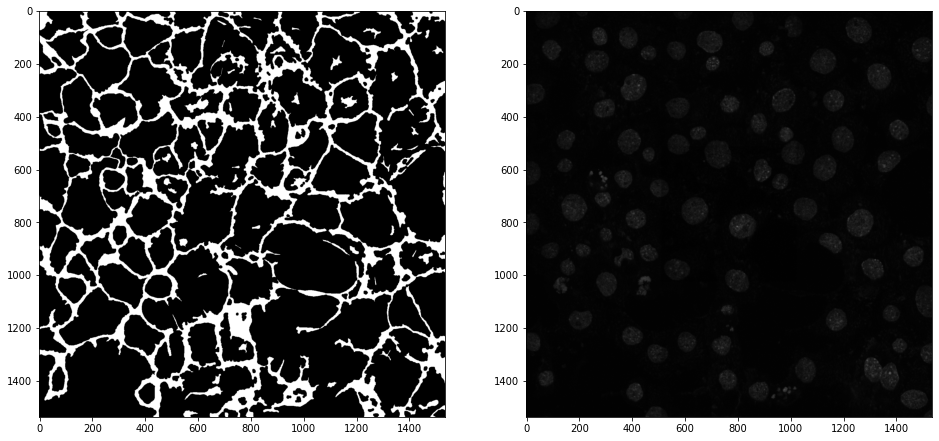

In [29]:
seg_path = '../data/Test/Segmented/CD151_A3_NOj-BI.tif'
seg_img = cv2.imread(seg_path)
nuclei_path = '../data/Test/Nuclei/CD151_A3_NOn.tif'
nuclei_img = cv2.imread(nuclei_path)

fig, axes = plt.subplots(1,2, figsize=(16, 8))
axes[0].imshow(seg_img)
axes[1].imshow(nuclei_img)

In [30]:
centroids = centutils.get_nuclei_centroids(nuclei_img)
centroids = centutils.clean_centroids(centroids, seg_img)
centroids, moments = centutils.get_moments_cells(centroids, seg_img)

areas = np.array([m['m00'] for m in moments])
areas.sort()
areas

array([   352.5,    368. ,    523.5,    820. ,   2936.5,   3519. ,
         3574. ,   4079.5,   4823.5,   5322. ,   5850.5,   6009. ,
         6359.5,   6445. ,   6499. ,   6842.5,   7045.5,   7410.5,
         7495.5,   8522. ,   8578.5,  10126.5,  10829.5,  10858. ,
        11069.5,  11745.5,  11854. ,  12385. ,  13356.5,  13993.5,
        14081.5,  14427. ,  15039. ,  15661. ,  16080. ,  16365. ,
        16738.5,  17063.5,  17869.5,  18169.5,  18889.5,  20580. ,
        21119. ,  21119. ,  21763. ,  23956.5,  26438.5,  27079. ,
        28250.5,  30009. ,  30735.5,  34902. ,  36786. ,  37437.5,
        37437.5,  47462.5,  47462.5,  62733.5,  62733.5,  62733.5,
        62918. ,  62918. ,  62918. ,  72633.5,  76793.5,  76793.5,
       235052.5, 235052.5])

There are SIX areas with size 313864. Those areas are not so big as the areas in the previous images (the ones with the padding), but nevertheless, it's an issue. Lets take a closer look.

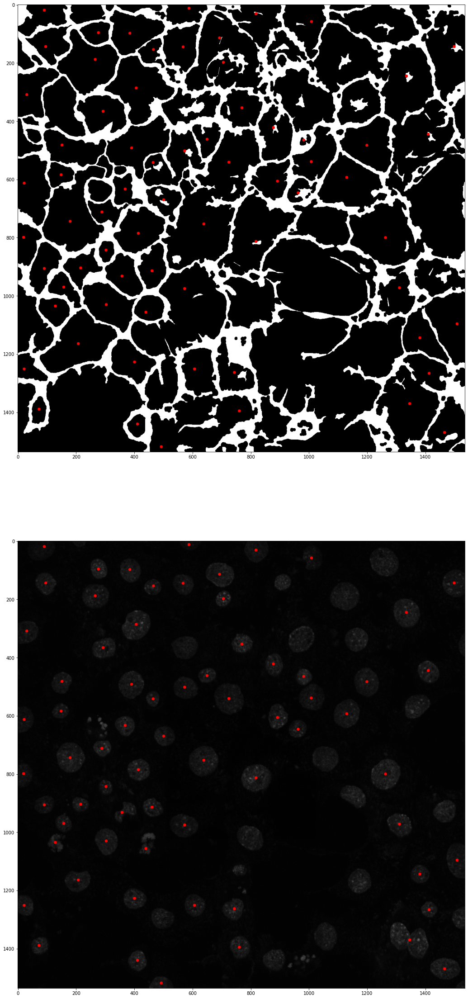

In [31]:
seg_centroid = centutils.draw_centroids(centroids, seg_img)
nuclei_centroid = centutils.draw_centroids(centroids, nuclei_img)

fig, axes = plt.subplots(2, figsize=(20, 40))
axes[0].imshow(seg_centroid)
axes[1].imshow(nuclei_centroid)

for centroid, moment in zip(centroids, moments):
    area = moment['m00']
    if area == 313864:
        axes[0].text(centroid[0], centroid[1], str(area), color='lightgreen', fontsize=20)
        axes[1].text(centroid[0], centroid[1], str(area), color='lightblue', fontsize=20)

The issue arises because in the nuclei image we detect six nucleus, but the corresponding areas in the segmented image are connected, there is no continuous segmentation among those cells. And also, because these numbers are messing with the mean and the std, the next thing happens:

In [32]:
mean, std = areas.mean(), areas.std()
313864 - mean, 3*std

(285102.29411764705, 124023.4678974495)

Those areas are not detected by the normality check. So a workaround is to use a stricter threshold.

❗ **Issue #4**: not fully connected segmentation. Workaround: use stricter segmentation.

And the other image:

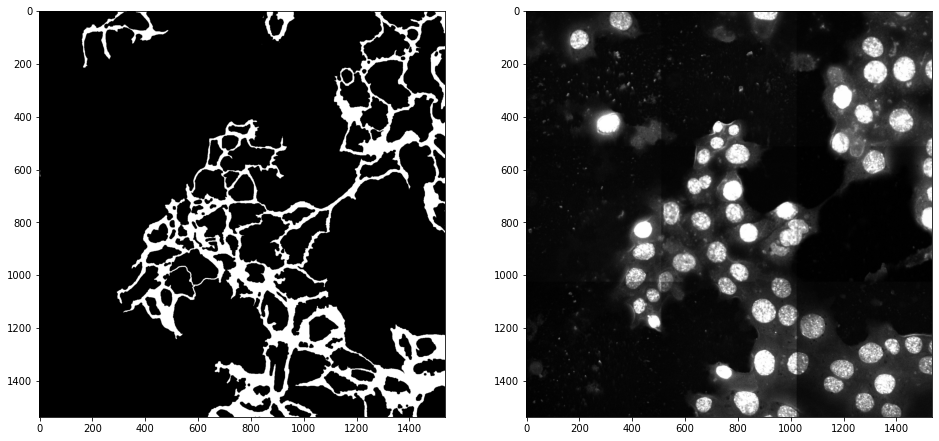

In [33]:
seg_path = '../data/first/Segmented/ACTN4_L2_NOj-BI.tif'
seg_img = cv2.imread(seg_path)
nuclei_path = '../data/first/Nuclei/ACTN4_L2_NOn.tif'
nuclei_img = cv2.imread(nuclei_path)

fig, axes = plt.subplots(1,2, figsize=(16, 8))
axes[0].imshow(seg_img)
axes[1].imshow(nuclei_img)

In [34]:
centroids = centutils.get_nuclei_centroids(nuclei_img)
centroids = centutils.clean_centroids(centroids, seg_img)
centroids, moments = centutils.get_moments_cells(centroids, seg_img)

areas = np.array([m['m00'] for m in moments])
areas.sort()
areas

array([   2131. ,    2252. ,    2259.5,    2283.5,    2322.5,    2731. ,
          3196. ,    3632. ,    5240.5,    7113. ,    7129. ,    7212. ,
          7824.5,    8135.5,    8549.5,    8608. ,    9555. ,   10030. ,
         12382. ,   13985. ,   16538. ,   18638.5,   29531. ,  299025.5,
       1288822.5, 1288822.5, 1288822.5, 1288822.5])

There are FOUR areas with size 1288822.5.

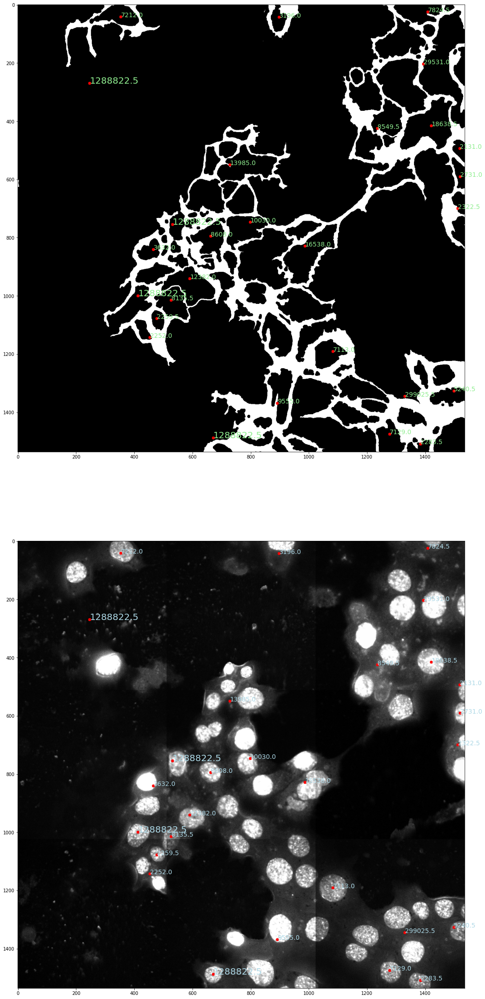

In [35]:
seg_centroid = centutils.draw_centroids(centroids, seg_img)
nuclei_centroid = centutils.draw_centroids(centroids, nuclei_img)

fig, axes = plt.subplots(2, figsize=(20, 40))
axes[0].imshow(seg_centroid)
axes[1].imshow(nuclei_centroid)

for centroid, moment in zip(centroids, moments):
    area = moment['m00']
    if area == 1288822.5:
        fontsize=20
    else:
        fontsize=14
    axes[0].text(centroid[0], centroid[1], str(area), color='lightgreen', fontsize=fontsize)
    axes[1].text(centroid[0], centroid[1], str(area), color='lightblue', fontsize=fontsize)

The issue with this image is the contrast in the nuclei image: while the other images have very little contrast, in this image you can clearly distinguish the nuclei.

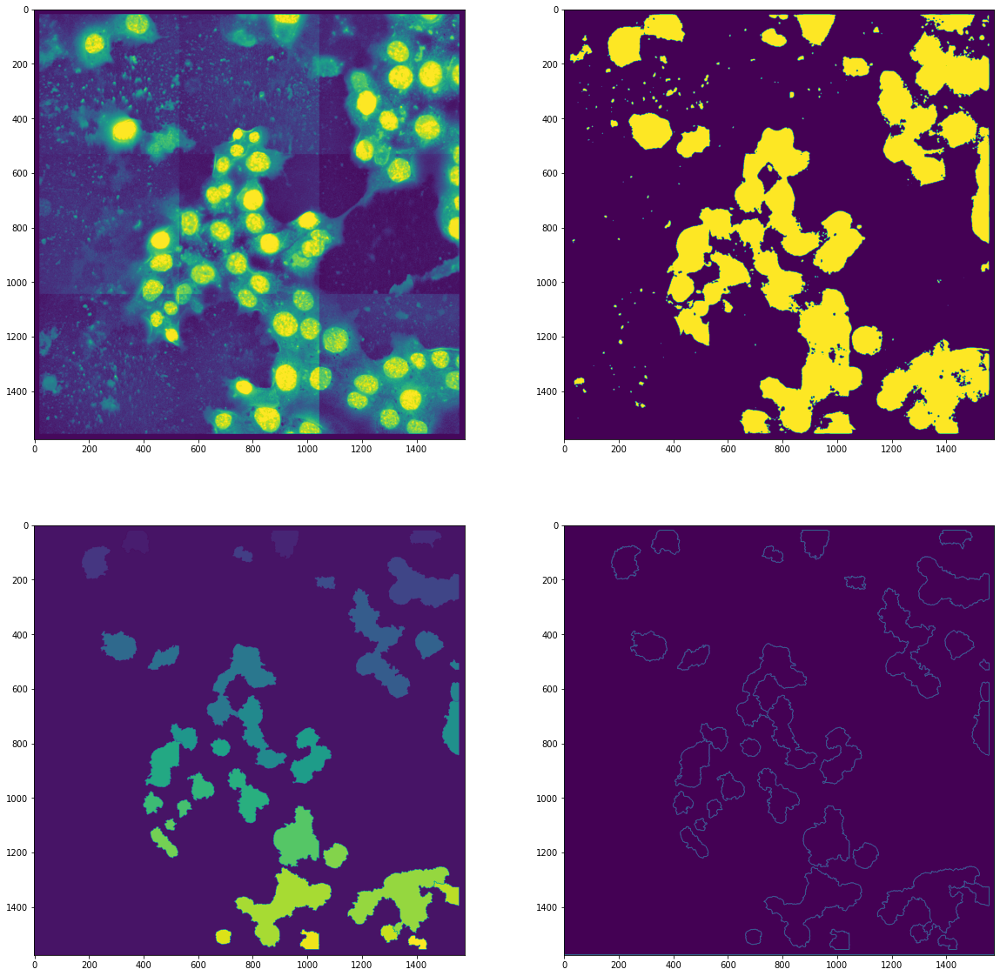

In [36]:
PIXELS_BORDER = 20
nuclei_img_expanded = cv2.copyMakeBorder(nuclei_img, PIXELS_BORDER, PIXELS_BORDER,
                                         PIXELS_BORDER, PIXELS_BORDER, cv2.BORDER_CONSTANT, 0)

nuclei_img_gray = cv2.cvtColor(nuclei_img_expanded, cv2.COLOR_BGR2GRAY)

# Enhance contrast (CLAHE - Contrast Limited Adaptive Histogram Equalization)

clahe = cv2.createCLAHE(clipLimit=5.0)
contrast_img = clahe.apply(nuclei_img_gray)

# Blurring
blur_img = cv2.GaussianBlur(contrast_img, (9,9),0)

# Thresholding (Otsu)
ret, thresh_img = cv2.threshold(blur_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
# Noise removal
kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(thresh_img, cv2.MORPH_OPEN, kernel, iterations=1)

# Sure background area
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.3*dist_transform.max(), 255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

markers_watershed = cv2.watershed(nuclei_img_expanded, markers)

contours_img = np.zeros(markers_watershed.shape, dtype='uint8')
contours_img[markers_watershed == -1] = 255

contours, hierarchy = cv2.findContours(contours_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)   

fig, ax = plt.subplots(2, 2, figsize=(20, 20))
ax[0, 0].imshow(contrast_img)
ax[0, 1].imshow(thresh_img)
ax[1, 0].imshow(markers_watershed)
ax[1, 1].imshow(contours_img)


❗ **Issue 5**: Nuclei image much different from the rest. Fix: not yet :( 

### Features visualization

Now that we have fixed many issues, lets reload and visualize the newly computed features.

In [37]:
df_first_path = '../results/first_features.csv'
df_negsi_path = '../results/NegsiRNA_features.csv'
df_test_path = '../results/Test_features.csv'

df_first = pd.read_csv(df_first_path, index_col=0)
df_negsi = pd.read_csv(df_negsi_path, index_col=0)
df_test = pd.read_csv(df_test_path, index_col=0)

df_first = df_first.fillna(-1)
df_negsi = df_negsi.fillna(-1)
df_test = df_test.fillna(-1)

df_inter_first_negsi = df_first.merge(df_negsi, left_index=True, right_index=True)
df_inter_first_test = df_first.merge(df_test, left_index=True, right_index=True)
df_inter_negsi_test = df_negsi.merge(df_test, left_index=True, right_index=True)

df_test_no_intersection = df_test.drop(df_inter_first_test.index)

df_first['folder'] = 'first'
df_negsi['folder'] = 'NegsiRNA'
df_test_no_intersection['folder'] = 'Test'

df_all = pd.concat([df_first, df_negsi, df_test_no_intersection])
df_all

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTB_B2_CA,0.603739,0.280296,8,11.673097,16.213742,10.770630,13.984421,0.970518,0.047607,361,...,0.927928,0.043215,1802,5,3.129856,0.344300,9.385630,6.708586,6.821478,first
ACTN4_L3_NO,0.643184,0.264147,2,5.328427,0.707107,4.621320,0.535534,0.868272,0.014719,508,...,0.931571,0.038830,2192,5,3.118157,0.329785,7.979354,5.130908,5.022501,first
ACTB_B2_NS,0.529037,0.393422,2,6.621320,4.535534,5.914214,4.363961,0.872069,0.061719,348,...,0.934128,0.037040,1796,5,3.131960,0.340088,13.342543,8.466754,8.152079,first
NegsiRNA_B1_NO,0.584348,0.361675,3,2.276142,1.863171,2.179106,1.696244,0.978017,0.038075,414,...,0.933158,0.040496,2281,5,3.140289,0.359689,10.740390,6.388646,6.126879,first
NegsiRNA_B1_CA,0.672008,0.249850,5,25.802439,24.656564,23.709567,23.061234,0.897672,0.111001,291,...,0.926734,0.048636,1637,6,3.149053,0.372899,9.099332,6.238017,6.140472,first
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PALLD_F2_CA,0.532583,0.352931,1,13.000000,-1.000000,13.000000,-1.000000,1.000000,-1.000000,272,...,0.933290,0.033352,1770,5,3.124859,0.333959,10.779967,6.281335,6.057167,Test
EZR_C3_NO,0.648874,0.290315,1,2.000000,-1.000000,2.000000,-1.000000,1.000000,-1.000000,312,...,0.928974,0.038882,1747,5,3.127075,0.344878,8.982927,5.137285,4.744985,Test
DNMBP_A3_NO,0.603660,0.226212,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,411,...,0.922374,0.055726,1867,5,3.135512,0.350006,7.369823,4.892748,4.893513,Test
NUMB_E3_CA,0.654215,0.271097,0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,275,...,0.932122,0.031318,1723,5,3.131167,0.347745,8.482209,5.014825,4.877564,Test


In [38]:
df_all['white_area_ratio'].max(), df_all['white_area_ratio'].min()

(0.4032105339898003, 0.13190163506401908)

In [39]:
df_all['cell_area_ratio'].max(), df_all['cell_area_ratio'].min()

(2.392914877997504, 0.4698001013861762)

In [40]:
df_all[df_all['cell_area_ratio'] > 1]

,cell_area_ratio,white_area_ratio,e2e_n,e2e_distance_mean,e2e_distance_std,e2e_eu_distance_mean,e2e_eu_distance_std,e2e_distance_ratio_mean,e2e_distance_ratio_std,j2e_n,...,j2j_distance_ratio_mean,j2j_distance_ratio_std,nodes_n,nodes_max,nodes_mean,nodes_std,medial_axis_mean,medial_axis_std,voronoi_approx_mean,folder
ACTN4_L2_NO,2.392915,0.131902,5,7.579899,10.316081,7.207723,9.877293,0.961666,0.03752,324,...,0.92105,0.062056,1380,5,3.126087,0.338433,7.74031,5.698707,5.822291,first


The only image that still have a ``cell_area_ratio`` out of bounds is the image with a lot of contrast in the nuclei.

In [ ]:
template_path = "../data/{folder}/{img_type}/{name}{suffix}.tif"

df_sorted = df_all.sort_values(by='white_area_ratio')
fig, axes = plt.subplots(49, 5, figsize=(5*2*5, 49*5))
for index, (img_name, row) in enumerate(df_sorted.iterrows()):
    seg_path = template_path.format(folder=row['folder'], img_type='Segmented', name=img_name, suffix='j-BI')
    nuclei_path = template_path.format(folder=row['folder'], img_type='Nuclei', name=img_name, suffix='n')
    seg_img = cv2.imread(seg_path)
    seg_img = cv2.resize(seg_img, (256, 256))
    nuclei_img = cv2.imread(nuclei_path)
    nuclei_img = cv2.resize(nuclei_img, (256, 256))
    
    img = 255*np.ones((256, 256*2 + 10, 3), dtype=seg_img.dtype)
    img[:, :256] = seg_img
    img[:, 256+10:] = nuclei_img
    
    iii, jjj = index // 5, index % 5
    axes[iii, jjj].imshow(img)
    axes[iii, jjj].set_yticks([])
    axes[iii, jjj].set_xticks([])
    axes[iii, jjj].set_xlabel('{img_name}: {war:.3f}'.format(img_name=img_name, war=row['white_area_ratio']), fontsize=20)
    
suptitle = fig.suptitle('Segmented and nuclei images, ordered by the feature white_area_ratio', y=1.005, fontsize=30)
fig.tight_layout()
fig.savefig('../results/white_area_ratio.png', bbox_extra_artists=(suptitle,), bbox_inches="tight")

In [ ]:
template_path = "../data/{folder}/{img_type}/{name}{suffix}.tif"

df_sorted = df_all.sort_values(by='cell_area_ratio')
fig, axes = plt.subplots(49, 5, figsize=(5*2*5, 49*5))
for index, (img_name, row) in enumerate(df_sorted.iterrows()):
    seg_path = template_path.format(folder=row['folder'], img_type='Segmented', name=img_name, suffix='j-BI')
    nuclei_path = template_path.format(folder=row['folder'], img_type='Nuclei', name=img_name, suffix='n')
    seg_img = cv2.imread(seg_path)
    seg_img = cv2.resize(seg_img, (256, 256))
    nuclei_img = cv2.imread(nuclei_path)
    nuclei_img = cv2.resize(nuclei_img, (256, 256))
    
    img = 255*np.ones((256, 256*2 + 10, 3), dtype=seg_img.dtype)
    img[:, :256] = seg_img
    img[:, 256+10:] = nuclei_img
    
    iii, jjj = index // 5, index % 5
    axes[iii, jjj].imshow(img)
    axes[iii, jjj].set_yticks([])
    axes[iii, jjj].set_xticks([])
    axes[iii, jjj].set_xlabel('{img_name}: {war:.3f}'.format(img_name=img_name, war=row['cell_area_ratio']), fontsize=20)
    
suptitle = fig.suptitle('Segmented and nuclei images, ordered by the feature cell_area_ratio', y=1.005, fontsize=30)
fig.tight_layout()
fig.savefig('../results/cell_area_ratio.png', bbox_extra_artists=(suptitle,), bbox_inches="tight")